In [11]:
import h5py
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import timm
import matplotlib.pyplot as plt

# ---------------------------------------------
# 1. Load and Preprocess the Data
# ---------------------------------------------
with h5py.File("Houston18.mat", "r") as f:
    # ori_data is stored as (bands, height, width) = (48, 954, 210)
    ori_data = np.array(f['ori_data'])
with h5py.File("Houston18_7gt.mat", "r") as f:
    # Ground truth segmentation mask of shape (954, 210)
    gt_data = np.array(f['map'])

# Convert ori_data to shape (height, width, channels)
hsi_data = np.transpose(ori_data, (1, 2, 0))  # (954, 210, 48)

# Normalize the HSI data (min-max normalization)
hsi_data = (hsi_data - hsi_data.min()) / (hsi_data.max() - hsi_data.min())

# Convert ground truth to integer type.
# Assume ground truth is 1-indexed for labeled pixels and 0 for unlabeled.
gt_data = gt_data.astype(np.int64)

print("HSI shape:", hsi_data.shape)  # (954, 210, 48)
print("GT shape:", gt_data.shape)      # (954, 210)

# ---------------------------------------------
# 2. Split the Image into Patches
# ---------------------------------------------
patch_size = 16# spatial patch size (before resizing)

def extract_patches(hsi, gt, patch_size):
    H, W, C = hsi.shape
    patches = []
    patch_labels = []
    stride = patch_size  # non-overlapping
    for i in range(0, H - patch_size + 1, stride):
        for j in range(0, W - patch_size + 1, stride):
            hsi_patch = hsi[i:i+patch_size, j:j+patch_size, :]  # (patch_size, patch_size, C)
            gt_patch = gt[i:i+patch_size, j:j+patch_size]         # (patch_size, patch_size)
            patches.append(hsi_patch)
            patch_labels.append(gt_patch)
    return patches, patch_labels

patches, patch_labels = extract_patches(hsi_data, gt_data, patch_size)
print("Number of patches:", len(patches))

# ---------------------------------------------
# 3. Define Resize Functions for Image and Label Patches
# ---------------------------------------------
def resize_img_tensor(img_tensor, size=(224, 224)):
    img_tensor = img_tensor.unsqueeze(0)  # (1, C, H, W)
    img_tensor = F.interpolate(img_tensor, size=size, mode='bilinear', align_corners=False)
    return img_tensor.squeeze(0)

def resize_label_tensor(label_tensor, size=(224, 224)):
    label_tensor = label_tensor.unsqueeze(0).unsqueeze(0).float()  # (1, 1, H, W)
    label_tensor = F.interpolate(label_tensor, size=size, mode='nearest')
    return label_tensor.squeeze(0).squeeze(0).long()

# ---------------------------------------------
# 4. Create a Custom Dataset Class
# ---------------------------------------------
class HoustonHSIDataset(Dataset):
    def __init__(self, patches, patch_labels):
        self.patches = patches
        self.patch_labels = patch_labels

    def __len__(self):
        return len(self.patches)

    def __getitem__(self, idx):
        # Convert patch and label to torch tensors.
        patch = self.patches[idx]  # shape: (patch_size, patch_size, channels)
        label = self.patch_labels[idx]  # shape: (patch_size, patch_size)
        patch_tensor = torch.tensor(patch, dtype=torch.float32).permute(2, 0, 1)
        # Subtract 1 from label so that labels become 0-indexed.
        label_tensor = torch.tensor(label, dtype=torch.long) - 1

        # Resize to 224x224.
        patch_tensor = resize_img_tensor(patch_tensor, size=(224, 224))
        label_tensor = resize_label_tensor(label_tensor, size=(224, 224))
        return patch_tensor, label_tensor

dataset = HoustonHSIDataset(patches, patch_labels)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# ---------------------------------------------
# 5. Define the Segmentation Model Using a Swin Backbone
# ---------------------------------------------
class SwinHSISegmentation(nn.Module):
    def __init__(self, num_classes=7):
        super(SwinHSISegmentation, self).__init__()
        self.backbone = timm.create_model(
            'swin_tiny_patch4_window7_224',
            pretrained=True,
            in_chans=48,
            features_only=True
        )
        self.decoder = nn.Conv2d(768, num_classes, kernel_size=1)

    def forward(self, x):
        features = self.backbone(x)[-1]  # Expected shape: (B, 768, H, W) or (B, H, W, 768)
        if features.dim() == 4 and features.shape[-1] == 768:
            features = features.permute(0, 3, 1, 2)
        seg_logits = self.decoder(features)
        seg_logits = F.interpolate(seg_logits, size=x.shape[2:], mode='bilinear', align_corners=False)
        return seg_logits

num_classes = 7
model = SwinHSISegmentation(num_classes=num_classes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# ---------------------------------------------
# 6. Define Training and Evaluation Functions
# ---------------------------------------------
def train_model(model, dataloader, epochs=10, lr=0.001):
    # Use ignore_index=-1 so that pixels originally labeled 0 (which become -1) are ignored.
    criterion = nn.CrossEntropyLoss(ignore_index=-1)
    optimizer = optim.AdamW(model.parameters(), lr=lr)
    model.train()
    for epoch in range(epochs):
        running_loss = 0.0
        correct, total = 0, 0
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)  # inputs: (B,48,224,224), labels: (B,224,224)
            optimizer.zero_grad()
            outputs = model(inputs)  # outputs: (B, num_classes, 224, 224)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            preds = outputs.argmax(dim=1)  # (B,224,224)

            correct += (preds == labels).sum().item()
            total += labels.numel()
        acc = 100 * correct / total
        print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss:.4f}, Accuracy: {acc:.2f}%")

def evaluate_model(model, dataloader):
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.numel()
    acc = 100 * correct / total
    print(f"Test Accuracy: {acc:.2f}%")

# ---------------------------------------------
# 7. Train and Evaluate the Model
# ---------------------------------------------
train_model(model, train_loader, epochs=30, lr=0.01)
evaluate_model(model, test_loader)


HSI shape: (954, 210, 48)
GT shape: (954, 210)
Number of patches: 767
Epoch 1/30, Loss: 14881.9325, Accuracy: 9.69%
Epoch 2/30, Loss: 24313.0285, Accuracy: 10.74%
Epoch 3/30, Loss: 6759.8452, Accuracy: 10.82%
Epoch 4/30, Loss: 2971.5623, Accuracy: 9.72%
Epoch 5/30, Loss: 2394.5376, Accuracy: 12.18%
Epoch 6/30, Loss: 985.5492, Accuracy: 10.89%
Epoch 7/30, Loss: 597.6666, Accuracy: 10.17%
Epoch 8/30, Loss: 310.7772, Accuracy: 11.68%
Epoch 9/30, Loss: 342.9084, Accuracy: 9.62%
Epoch 10/30, Loss: 194.6853, Accuracy: 12.59%
Epoch 11/30, Loss: 108.7552, Accuracy: 11.98%
Epoch 12/30, Loss: 94.1597, Accuracy: 14.47%
Epoch 13/30, Loss: 67.3493, Accuracy: 14.96%
Epoch 14/30, Loss: 67.3636, Accuracy: 13.15%
Epoch 15/30, Loss: 62.2025, Accuracy: 14.71%
Epoch 16/30, Loss: 59.4399, Accuracy: 16.15%
Epoch 17/30, Loss: 62.1245, Accuracy: 15.82%
Epoch 18/30, Loss: 61.8951, Accuracy: 14.52%


KeyboardInterrupt: 

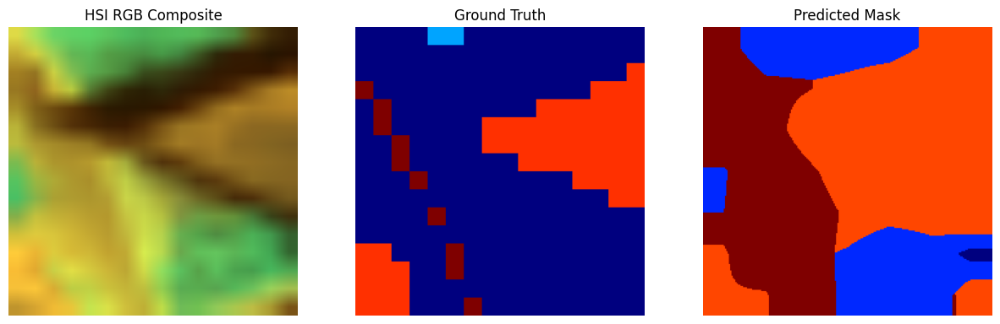

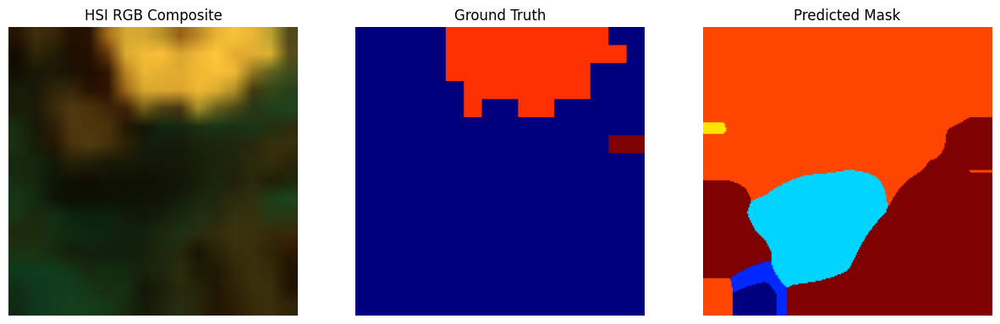

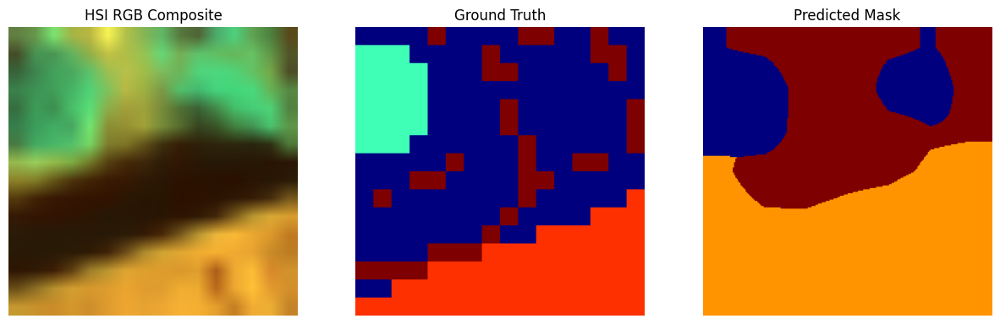

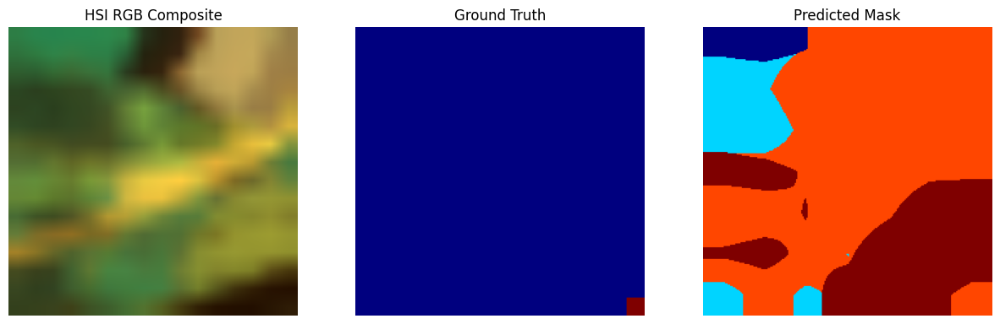

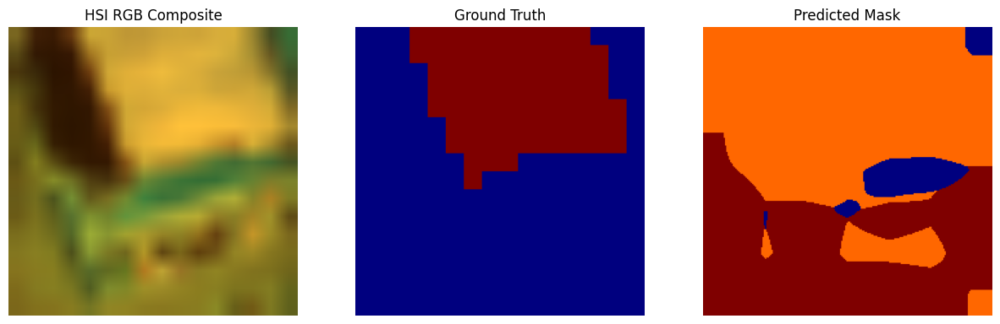

...

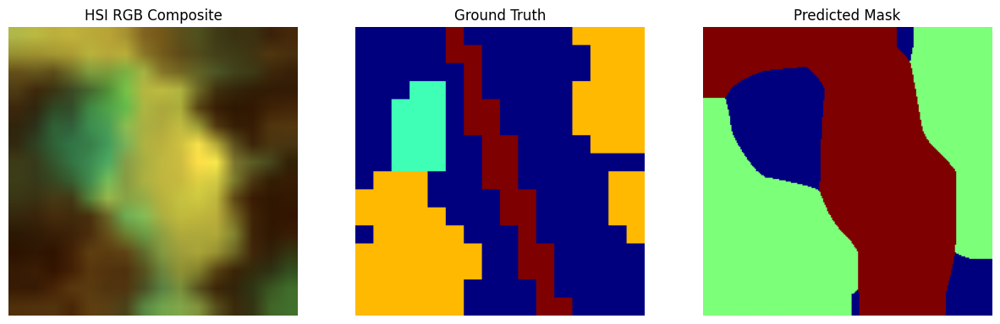

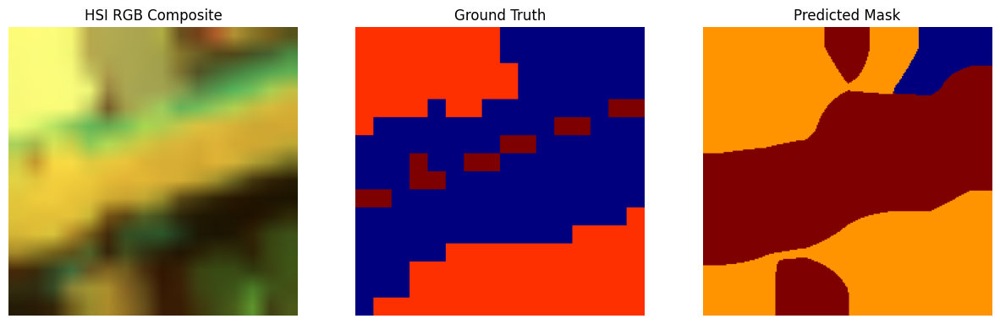

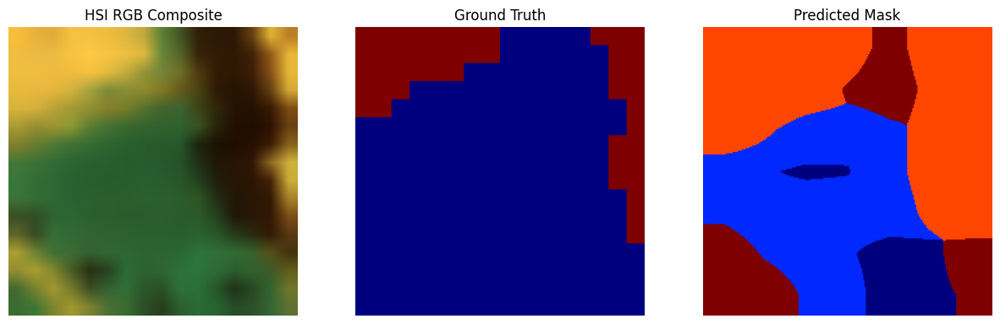

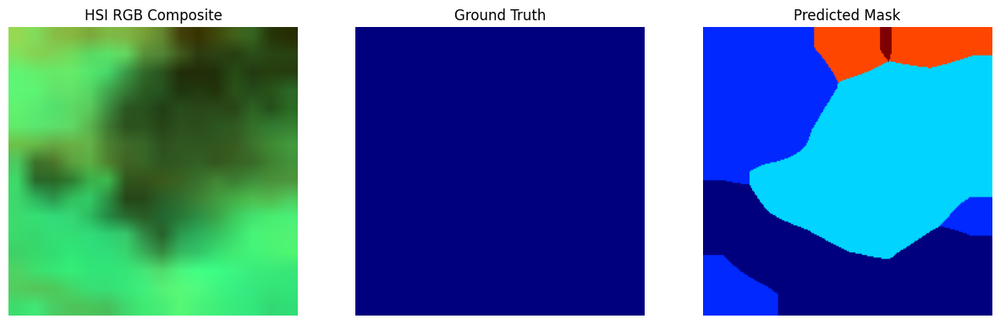

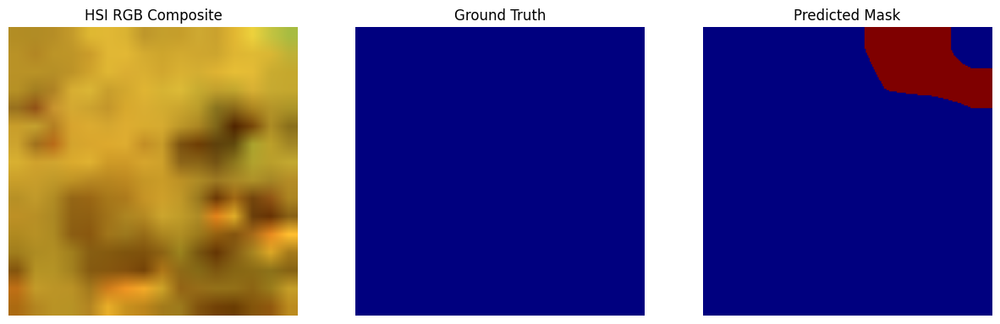

In [9]:
import matplotlib.pyplot as plt

def create_rgb_composite(hsi_patch, band_indices=(10, 25, 40)):
    """
    Create an RGB composite from an HSI patch by selecting three bands.
    hsi_patch: Tensor of shape (48, H, W) with 48 spectral bands.
    band_indices: tuple of three indices (e.g., (10, 25, 40))
    Returns: numpy array of shape (H, W, 3)
    """
    # Extract the three bands, then stack along the channel dimension.
    # hsi_patch is assumed to be in (C, H, W) format.
    rgb = hsi_patch[band_indices, :, :].permute(1, 2, 0).cpu().numpy()
    # Normalize for visualization.
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min())
    return rgb

def visualize_results(model, dataloader, num_samples=3):
    model.eval()
    samples_visualized = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)   # shape: (B,48,224,224)
            labels = labels.to(device)   # shape: (B,224,224)
            outputs = model(inputs)      # shape: (B,num_classes,224,224)
            preds = outputs.argmax(dim=1)  # shape: (B,224,224)

            # Loop over batch samples
            for i in range(inputs.size(0)):
                if samples_visualized >= num_samples:
                    return

                hsi_patch = inputs[i]  # (48,224,224)
                gt_mask   = labels[i]  # (224,224)
                pred_mask = preds[i]   # (224,224)

                rgb = create_rgb_composite(hsi_patch)

                # Plot the images
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                axes[0].imshow(rgb)
                axes[0].set_title("HSI RGB Composite")
                axes[0].axis("off")

                axes[1].imshow(gt_mask.cpu(), cmap="jet")
                axes[1].set_title("Ground Truth")
                axes[1].axis("off")

                axes[2].imshow(pred_mask.cpu(), cmap="jet")
                axes[2].set_title("Predicted Mask")
                axes[2].axis("off")

                plt.show()
                samples_visualized += 1

# Visualize a few test samples:
visualize_results(model, test_loader, num_samples=100
                  )


In [15]:
import os
import numpy as np
import scipy.io
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import timm  # pip install timm
import torchvision.transforms as T
from math import floor
import h5py


#############################################
# 1. Dataset Class: Load .mat and Extract Patches
#############################################

class HoustonMatDataset(Dataset):
    """
    Dataset for the Houston hyperspectral image stored in a .mat file.
    Assumes:
      - A single .mat file contains the hyperspectral data with shape (H, W, 48)
        under the key 'data' (modify as needed).
      - A separate .mat file contains the ground truth with shape (H, W)
        under the key 'label' (modify as needed).
    This class extracts overlapping patches from the full image.
    """
    def __init__(self, data_mat_path, label_mat_path, patch_size=(16,16), stride=(16,16), transform=None):
        super().__init__()

        with h5py.File("Houston18.mat", "r") as f:
            # ori_data is stored as (bands, height, width) = (48, 954, 210)
            self.ori_data = np.array(f['ori_data'])
        with h5py.File("Houston18_7gt.mat", "r") as f:
            # Ground truth segmentation mask of shape (954, 210)
            self.gt_data = np.array(f['map'])
        # # Load the .mat files
        # data_mat = scipy.io.loadmat(data_mat_path)
        # label_mat = scipy.io.loadmat(label_mat_path)
        # Change these keys if needed to match your .mat file variable names.
        self.full_image = ori_data  # shape (H, W, 48)
        self.full_label = gt_data  # shape (H, W)
        self.transform = transform

        # Get spatial dimensions
        self.H, self.W, self.C = self.full_image.shape
        self.patch_h, self.patch_w = patch_size
        self.stride_h, self.stride_w = stride

        # Precompute list of patch top-left coordinates
        self.patches = []
        for i in range(0, self.H - self.patch_h + 1, self.stride_h):
            for j in range(0, self.W - self.patch_w + 1, self.stride_w):
                self.patches.append((i, j))
        # Optionally, you can shuffle these or split into train/val externally.

    def __len__(self):
        return len(self.patches)

    def __getitem__(self, idx):
        i, j = self.patches[idx]
        patch = self.full_image[i:i+self.patch_h, j:j+self.patch_w, :]  # shape (patch_h, patch_w, 48)
        patch_label = self.full_label[i:i+self.patch_h, j:j+self.patch_w]  # shape (patch_h, patch_w)

        # Convert to torch tensor and rearrange to (C, H, W)
        patch = torch.from_numpy(patch).permute(2, 0, 1).float()
        patch_label = torch.from_numpy(patch_label).long()

        if self.transform:
            patch = self.transform(patch)

        return patch, patch_label

#############################################
# 2. Modify Swin Transformer Patch Embedding
#############################################

def modify_swin_input_channels(model, new_in_chans=48):
    """
    Replace the patch embedding projection of a Swin Transformer model to accept new_in_chans.
    """
    old_conv = model.patch_embed.proj  # weight shape: [embed_dim, in_chans, k, k]
    old_weight = old_conv.weight  # e.g., shape [96, 3, 4, 4]
    embed_dim = old_conv.out_channels
    kernel_size = old_conv.kernel_size
    stride = old_conv.stride
    padding = old_conv.padding

    # Create new conv with new_in_chans
    new_conv = nn.Conv2d(new_in_chans, embed_dim, kernel_size=kernel_size,
                         stride=stride, padding=padding, bias=old_conv.bias is not None)
    # If new_in_chans is an integer multiple of old in_channels, repeat weights.
    if new_in_chans % old_conv.in_channels == 0:
        repeat_factor = new_in_chans // old_conv.in_channels
        new_conv.weight.data = old_weight.repeat(1, repeat_factor, 1, 1) / repeat_factor
    else:
        nn.init.kaiming_normal_(new_conv.weight, mode='fan_out', nonlinearity='relu')

    model.patch_embed.proj = new_conv
    return model

#############################################
# 3. DCFAM-inspired Decoder Module
#############################################

class DCFAM(nn.Module):
    """
    A simplified Densely Connected Feature Aggregation Module.
    It fuses multi-scale features (from the Swin backbone) using 1x1 convs and upsampling.
    """
    def __init__(self, embed_dims, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(embed_dims[0], out_channels, kernel_size=1)
        self.conv2 = nn.Conv2d(embed_dims[1], out_channels, kernel_size=1)
        self.conv3 = nn.Conv2d(embed_dims[2], out_channels, kernel_size=1)
        self.conv4 = nn.Conv2d(embed_dims[3], out_channels, kernel_size=1)
        # Upsample to highest resolution (assume factor 2 between stages)
        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.up3 = nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False)
        self.up4 = nn.Upsample(scale_factor=8, mode='bilinear', align_corners=False)
        self.fuse = nn.Sequential(
            nn.Conv2d(out_channels * 4, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, features):
        f1 = self.conv1(features[0])
        f2 = self.conv2(features[1])
        f3 = self.conv3(features[2])
        f4 = self.conv4(features[3])
        f2_up = self.up2(f2)
        f3_up = self.up3(f3)
        f4_up = self.up4(f4)
        f_cat = torch.cat([f1, f2_up, f3_up, f4_up], dim=1)
        out = self.fuse(f_cat)
        return out

#############################################
# 4. Overall Segmentation Model
#############################################

class DC_SwinSeg(nn.Module):
    def __init__(self, num_classes, in_chans=48, backbone_name='swin_small_patch4_window7_224', pretrained=True):
        """
        DC_SwinSeg: A semantic segmentation network using a Swin Transformer backbone
        (modified to accept 48 channels) and a DCFAM-inspired decoder.
        """
        super().__init__()
        # Use timm to create a backbone that outputs multi-scale features
        self.backbone = timm.create_model(backbone_name, pretrained=pretrained, num_classes=0, features_only=True)
        self.backbone = modify_swin_input_channels(self.backbone, new_in_chans=in_chans)
        # Get backbone feature dimensions from timm's feature_info list
        feature_info = self.backbone.feature_info
        embed_dims = [info['num_chs'] for info in feature_info]  # e.g., [96, 192, 384, 768]

        # Build decoder: here we set output channels to 256 (tunable)
        self.decoder = DCFAM(embed_dims, out_channels=256)
        self.seg_head = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, num_classes, kernel_size=1)
        )

    def forward(self, x):
        # x: [B, 48, H, W]
        features = self.backbone.forward_features(x)  # List of features from different stages
        agg_features = self.decoder(features)
        logits = self.seg_head(agg_features)
        # Upsample logits to original size if needed
        logits = F.interpolate(logits, size=x.shape[2:], mode='bilinear', align_corners=False)
        return logits

#############################################
# 5. Training Script Outline
#############################################

def train_segmentation(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    for images, labels in dataloader:
        images = images.to(device)  # [B, 48, H, W]
        labels = labels.to(device)  # [B, H, W]
        optimizer.zero_grad()
        outputs = model(images)  # [B, num_classes, H, W]
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * images.size(0)
    return total_loss / len(dataloader.dataset)

def validate_segmentation(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
    return total_loss / len(dataloader.dataset)

if __name__ == '__main__':
    # Hyperparameters
    num_classes = 7  # adjust to your number of classes
    num_epochs = 50
    learning_rate = 1e-4
    batch_size = 4

    # File paths for your .mat files (adjust these paths and variable names as needed)
    data_mat_path = './houston_data.mat'    # should contain the data with shape (954, 210, 48)
    label_mat_path = './houston_label.mat'   # should contain the ground truth with shape (954, 210)

    # Create the dataset (extract patches from the full image)
    patch_size = (128, 128)
    stride = (64, 64)
    dataset = HoustonMatDataset(data_mat_path, label_mat_path, patch_size=patch_size, stride=stride)

    # Optionally, split into training and validation patches (e.g., 80/20 split)
    num_samples = len(dataset)
    indices = list(range(num_samples))
    split = int(np.floor(0.2 * num_samples))
    np.random.shuffle(indices)
    train_indices, val_indices = indices[split:], indices[:split]

    from torch.utils.data import Subset
    train_dataset = Subset(dataset, train_indices)
    val_dataset = Subset(dataset, val_indices)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    # Device configuration
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize the model
    model = DC_SwinSeg(num_classes=num_classes, in_chans=48, backbone_name='swin_small_patch4_window7_224', pretrained=True)
    model = model.to(device)

    # Loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

    # Training loop
    for epoch in range(num_epochs):
        train_loss = train_segmentation(model, train_loader, optimizer, criterion, device)
        val_loss = validate_segmentation(model, val_loader, criterion, device)
        print(f"Epoch [{epoch+1}/{num_epochs}] Train Loss: {train_loss:.4f}  Val Loss: {val_loss:.4f}")

    # Save model checkpoint
    torch.save(model.state_dict(), "DC_SwinSeg_Houston.pth")


ValueError: num_samples should be a positive integer value, but got num_samples=0

In [13]:
print("Total patches:", len(self.patches))


NameError: name 'self' is not defined